# The “Tree Cadastre of the City of Konstanz”

First, get the tree cadastre data from the [open data portal of the city of Konstanz](https://offenedaten-konstanz.de/dataset/baumkataster-konstanz). Save it on the file path shown below. For convenience one (potentially outdated) version is included in this repository. The CSV file is then loaded into a pandas "DataFrame":

In [1]:
import pandas as pd

tree_cadastre_file = 'data/KN_Baumkataster_2020S.csv'
df = pd.read_csv(tree_cadastre_file)
df.shape  # table size (rows, columns)

(15936, 13)

Note: Pandas could read the CSV directly from the WWW if a URL is passed. With internet access and supposed the download URL is still valid, the data frame is also loaded by
```python
df = pd.read_csv('https://opendata.arcgis.com/api/v3/datasets/b5d600268d87451db3faf41463c69fd3_87/downloads/data?format=csv&spatialRefId=4326&where=1%3D1')
```

Let's now have a first and quick look into the data using pandas methods:

In [2]:
df.head() # first lines of the table

,X,Y,OBJECTID,baumId,baumNr,baumart,hoeheM,kronendurchmesserM,stammumfangCM,location,Name_dt,Name_lat,Name_Sym
0,9.158918,47.739471,1,4,4.0,182,11.0,12,169.0,Bubenbad Dingelsdorf (754),"Nussbaum, Walnuss",Juglans regia,Juglans Regia
1,9.159193,47.739428,2,5,3.0,52,11.0,7,74.0,Bubenbad Dingelsdorf (754),"Erle, Schwarz-Erle",Alnus glutinosa,Alnus
2,9.158987,47.739541,3,6,5.0,37,14.0,7,135.0,Bubenbad Dingelsdorf (754),"Ahorn, Berg-Ahorn",Acer pseudoplatanus,Acer
3,9.159219,47.739676,4,9,8.0,284,22.0,20,380.0,Bubenbad Dingelsdorf (754),"Pappel, Schwarz-Pappel",Populus nigra,Populus
4,9.159252,47.739639,5,10,9.0,338,7.0,9,142.0,Bubenbad Dingelsdorf (754),"Eiche, Stiel-Eiche, Sommer-Eiche",Quercus robur,Quercus Rubra


In [3]:
df.describe() # descriptive statistics (numerical columns)

,X,Y,OBJECTID,baumId,baumNr,baumart,hoeheM,kronendurchmesserM,stammumfangCM
count,15936.000000,15936.000000,15936.00000,15936.000000,15843.000000,15936.000000,15901.000000,15936.000000,15899.000000
mean,9.169918,47.682032,7968.50000,14367.153865,58.978098,307.874372,10.496635,6.018763,110.966727
std,0.021995,0.023834,4600.47128,10679.190468,111.792192,205.958031,6.409452,3.902156,84.016540
min,9.106630,47.653233,1.00000,4.000000,0.000000,1.000000,1.000000,0.000000,0.000000
25%,9.153556,47.666955,3984.75000,6062.750000,6.000000,78.000000,5.000000,3.000000,48.000000
50%,9.170486,47.674953,7968.50000,12589.000000,20.000000,322.000000,9.000000,5.000000,91.000000
75%,9.180678,47.684028,11952.25000,18540.250000,59.000000,501.000000,15.000000,8.000000,155.000000
max,9.217534,47.748520,15936.00000,39828.000000,819.000000,640.000000,40.000000,30.000000,900.000000


In [4]:
df.nunique() # number of unique values in each column

X                     15930
Y                     15930
OBJECTID              15936
baumId                15936
baumNr                  811
baumart                 304
hoeheM                   35
kronendurchmesserM       26
stammumfangCM           467
location                789
Name_dt                 300
Name_lat                302
Name_Sym                 48
dtype: int64

... and we identify the following columns (cf. the provided [tree cadastre metadata](https://offenedaten-konstanz.de/dataset/baumkataster-konstanz/resource/ed175ffd-96c9-45f7-9e6c-ec9fc40d1d04)):

- the pandas row index
- "X" and "Y": geographic coordinates (longitude and latitude)
- "OBJECTID", "baumid", "baumNr": three different tree IDs
- "baumart": a nummeric species ID
- "hoeheM": the tree height (m)
- "kronendurchmesserM": treetop diameter (m)
- "stammumfangCM": trunk perimeter (cm)
- "location": coarse location of the tree (street name)
- "Name_dt": German tree name
- "Name_lat": Latin tree name
- "Name_Sym": vendor-specific name (fewer values, no special characters, likely for plotting as categorical value)

We clean up the data a little bit:
- translate the German column names
- drop the columns not used later on
- use the column "OBJECTID" as row index

In [5]:
df.rename(columns={'hoeheM': 'height (m)',
                   'kronendurchmesserM': 'treetop diameter (m)',
                   'stammumfangCM': 'trunk perimeter (cm)'},
          inplace=True)
df.drop(columns=['baumId', 'baumNr', 'baumart', 'Name_Sym'], inplace=True)
df.set_index('OBJECTID', inplace=True)
df.head()

,X,Y,height (m),treetop diameter (m),trunk perimeter (cm),location,Name_dt,Name_lat
OBJECTID,,,,,,,,
1,9.158918,47.739471,11.0,12,169.0,Bubenbad Dingelsdorf (754),"Nussbaum, Walnuss",Juglans regia
2,9.159193,47.739428,11.0,7,74.0,Bubenbad Dingelsdorf (754),"Erle, Schwarz-Erle",Alnus glutinosa
3,9.158987,47.739541,14.0,7,135.0,Bubenbad Dingelsdorf (754),"Ahorn, Berg-Ahorn",Acer pseudoplatanus
4,9.159219,47.739676,22.0,20,380.0,Bubenbad Dingelsdorf (754),"Pappel, Schwarz-Pappel",Populus nigra
5,9.159252,47.739639,7.0,9,142.0,Bubenbad Dingelsdorf (754),"Eiche, Stiel-Eiche, Sommer-Eiche",Quercus robur


## Estimate Volume of Wood

Assume that a tree trunk is a [cone](https://en.wikipedia.org/wiki/Cone) and calculate the volume accordingly.The Volume $V$ calculated based on the perimeter ($p = 2r\pi$) is:

$$V = \frac{1}{3} \pi r^2 h = \frac{p^2}{12\pi}$$

Assuming a cone may is a small underestimate of the real trunk volume. Another estimation used for forest trees (diameter at breast height, DBH [[1](https://en.wikipedia.org/wiki/Diameter_at_breast_height), [2](https://www.wald-prinz.de/brusthohendurchmesser-bhd-vs-mittendurchmesser/3652)]) leads to 40% more volume. This might be also because the trunk perimeter is measured not a the base but in 1-1.5 meters height. The tree cadastre metadata does not include a description how the measurements are made.

In [6]:
import math

# volume of the trunk assuming a cone shape
df['trunk volume (qm)'] = ((df['trunk perimeter (cm)']/100.0) ** 2 / (12*math.pi)) * df['height (m)']
df.head()

,X,Y,height (m),treetop diameter (m),trunk perimeter (cm),location,Name_dt,Name_lat,trunk volume (qm)
OBJECTID,,,,,,,,,
1,9.158918,47.739471,11.0,12,169.0,Bubenbad Dingelsdorf (754),"Nussbaum, Walnuss",Juglans regia,0.833364
2,9.159193,47.739428,11.0,7,74.0,Bubenbad Dingelsdorf (754),"Erle, Schwarz-Erle",Alnus glutinosa,0.159781
3,9.158987,47.739541,14.0,7,135.0,Bubenbad Dingelsdorf (754),"Ahorn, Berg-Ahorn",Acer pseudoplatanus,0.676806
4,9.159219,47.739676,22.0,20,380.0,Bubenbad Dingelsdorf (754),"Pappel, Schwarz-Pappel",Populus nigra,8.426724
5,9.159252,47.739639,7.0,9,142.0,Bubenbad Dingelsdorf (754),"Eiche, Stiel-Eiche, Sommer-Eiche",Quercus robur,0.374407


In [7]:
df['trunk volume (qm)'].sum()

13734.350646116767

## Wood Mass, Energy, Bio Mass, CO₂

- wood mass: assume 500 kg per cubic meter because it's mostly hardwood with small amounts of conifer wood
- energy: 5 kWh / kg
- average gas consumption in Germany

In [8]:
# wood mass (t)
df['trunk volume (qm)'].sum() * .5

6867.175323058384

In [9]:
# energy (MWh)
df['trunk volume (qm)'].sum() * 500 * 5 / 1000

34335.87661529191

In [10]:
# kwH per inhabitant
df['trunk volume (qm)'].sum() * 500 * 5 / 86000

399.2543792475804

In [21]:
# Paper tons (in kg)
df['trunk volume (qm)'].sum() * .5 * 1000 / 2.2

3121443.328662901

In [22]:
# Paged A4 ( 4,99 g / page)
df['trunk volume (qm)'].sum() * .5 * 1000 / 2.2 / 0.00499

625539745.2230263

In [23]:
# Konstanz Budtet
df['trunk volume (qm)'].sum() * .5 * 1000 / 2.2 / 0.00499 / (571/2)

2191032.3825675175

In [24]:
# Years the city council can be equiped with printed budgets
df['trunk volume (qm)'].sum() * .5 * 1000 / 2.2 / 0.00499 / (571/2) / 40

54775.80956418793

In [25]:
# Pages per citizen
df['trunk volume (qm)'].sum() * .5 * 1000 / 2.2 / 0.00499 / 86000

7273.717967709608

In [26]:
# Pages per citizen
df['trunk volume (qm)'].sum() * .5 * 1000 / 2.2 / 86000

36.29585265887094

## Area (Shadow)

In [11]:
df['treetop area (sqm)'] = (df['treetop diameter (m)']/2) ** 2 * math.pi
df.head()

,X,Y,height (m),treetop diameter (m),trunk perimeter (cm),location,Name_dt,Name_lat,trunk volume (qm),treetop area (sqm)
OBJECTID,,,,,,,,,,
1,9.158918,47.739471,11.0,12,169.0,Bubenbad Dingelsdorf (754),"Nussbaum, Walnuss",Juglans regia,0.833364,113.097336
2,9.159193,47.739428,11.0,7,74.0,Bubenbad Dingelsdorf (754),"Erle, Schwarz-Erle",Alnus glutinosa,0.159781,38.484510
3,9.158987,47.739541,14.0,7,135.0,Bubenbad Dingelsdorf (754),"Ahorn, Berg-Ahorn",Acer pseudoplatanus,0.676806,38.484510
4,9.159219,47.739676,22.0,20,380.0,Bubenbad Dingelsdorf (754),"Pappel, Schwarz-Pappel",Populus nigra,8.426724,314.159265
5,9.159252,47.739639,7.0,9,142.0,Bubenbad Dingelsdorf (754),"Eiche, Stiel-Eiche, Sommer-Eiche",Quercus robur,0.374407,63.617251


In [12]:
df['treetop area (sqm)'].sum()/10000 # in ha

64.39707307163064

## Count Items

In [13]:
# count tree names and show the N most frequent tree names
N = 20
top_trees = df['Name_lat'].value_counts().head(N).to_frame()
top_trees

,Name_lat
Platanus x acerifolia,885
Betula pendula,794
Quercus robur,658
Tilia cordata,630
Fraxinus excelsior,600
Malus domestica,552
Salix alba,526
Acer platanoides,519
Acer pseudoplatanus,513
Carpinus betulus,498


In [14]:
# also show the top N German names
df['Name_dt'].value_counts().head(20).to_frame()

,Name_dt
Platane,950
"Birke, Sand-Birke",794
"Eiche, Stiel-Eiche, Sommer-Eiche",658
"Linde, Winter-Linde",630
"Esche, Esche gemeine",600
Kultur-Apfel,552
"Weide, Silber-Weide",526
"Ahorn, Spitz-Ahorn",519
"Ahorn, Berg-Ahorn",513
"Weißbuche, Hainbuche",498


Obviously, German names are less specific (there are more items of "Platane" than "Platanus x acerifolia"). To avoid inconsistencies we'll use the Latin names in the next steps. Because not everybody knows Latin well enough or studied botanology, let's prepare a translation table to see the Latin and German names site by site. We will later look how we could get the tree names in other languages as well.

In [15]:
tree_name_translation = df.loc[df['Name_lat'].isin(top_trees.index),
                               ['Name_lat', 'Name_dt']]
tree_name_translation['count'] = 1
tree_name_translation.groupby(['Name_lat', 'Name_dt']).sum() \
    .sort_values('count', ascending=False)

,,count
Name_lat,Name_dt,
Platanus x acerifolia,Platane,885
Betula pendula,"Birke, Sand-Birke",794
Quercus robur,"Eiche, Stiel-Eiche, Sommer-Eiche",658
Tilia cordata,"Linde, Winter-Linde",630
Fraxinus excelsior,"Esche, Esche gemeine",600
Malus domestica,Kultur-Apfel,552
Salix alba,"Weide, Silber-Weide",526
Acer platanoides,"Ahorn, Spitz-Ahorn",519
Acer pseudoplatanus,"Ahorn, Berg-Ahorn",513


## Plotting

We start with a first trivial scatter plot of the 3 metric values using the [plot method of the DataFrame](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.plot.html). We choose the [matplotlib's style "ggplot"](https://matplotlib.org/stable/gallery/style_sheets/ggplot.html) which mimics the look of the plots produced by a popular plotting package for R. There are many more [styles available](https://matplotlib.org/stable/gallery/style_sheets/style_sheets_reference.html).

<AxesSubplot:xlabel='trunk perimeter (cm)', ylabel='height (m)'>

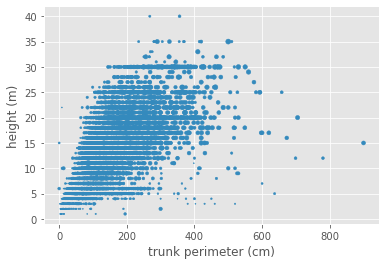

In [16]:
import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')

df.plot(kind='scatter',
        x='trunk perimeter (cm)',
        y='height (m)',
        s='treetop diameter (m)')

Insights from the first plot:
- data gathering: heights above 25m are rather estimates and tend to be rounded to the next 5m interval
- some noise, eg. high trees with very small trunk perimeter
- tree height, trunk perimeter and treetop diameter correlate but with broad variance

Let's look deeper into the correlation using the [Pearson coefficient](https://en.wikipedia.org/wiki/Pearson_correlation_coefficient):

In [17]:
metric_columns = ['trunk perimeter (cm)', 'height (m)', 'treetop diameter (m)']
df[metric_columns].corr(method='pearson')

,trunk perimeter (cm),height (m),treetop diameter (m)
trunk perimeter (cm),1.000000,0.770495,0.816329
height (m),0.770495,1.000000,0.753005
treetop diameter (m),0.816329,0.753005,1.000000


Now we take into account the tree types. We'll...
- focus on the top-20 most frequent names only and plot the metrics per tree on a 4x5 matrix
- and add some color to the plots

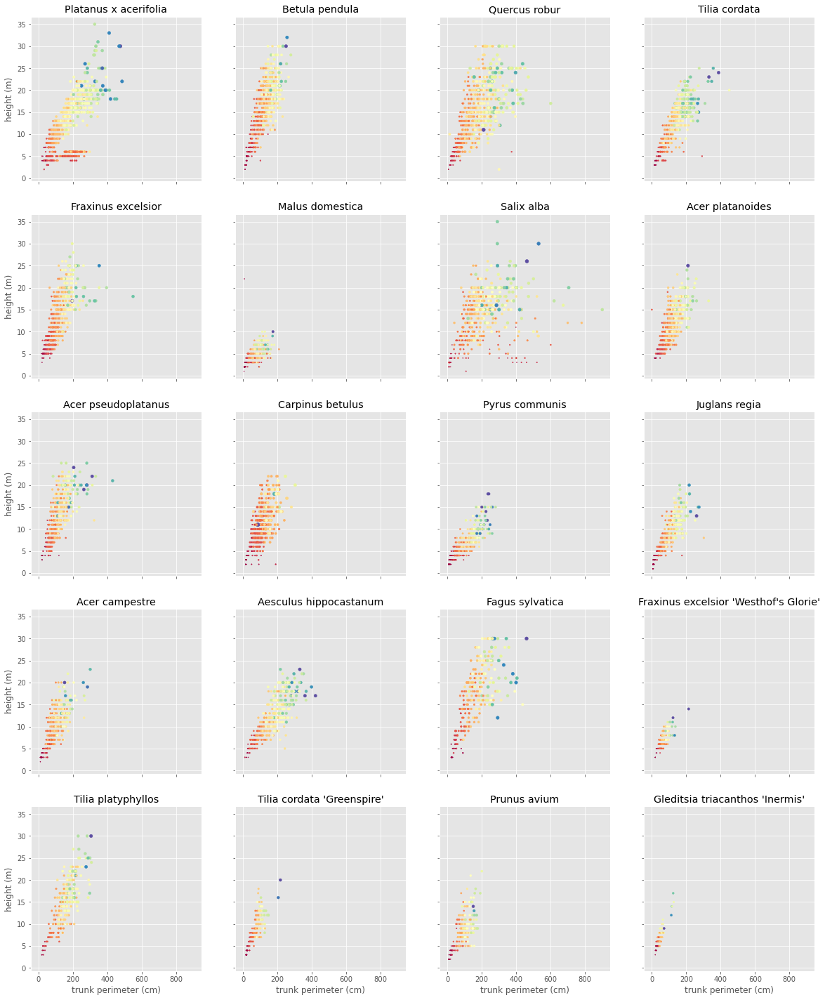

In [18]:
fig, axes = plt.subplots(nrows=5, ncols=4, sharex=True, sharey=True,
                         squeeze=False, figsize=[20,25])

n = 0
for tree in top_trees.index.to_list():
    plot = df[df['Name_lat']==tree].plot(
        kind='scatter',
        ax=axes[int(n/4),n%4],
        title=tree,
        x='trunk perimeter (cm)',
        y='height (m)',
        s='treetop diameter (m)', # show by point size
        c='treetop diameter (m)', # also indicated by color
        colormap='Spectral',
        #norm=matplotlib.colors.LogNorm(vmin=1, vmax=25),
        colorbar=None)
    n += 1
plt.savefig('figures/trees_size_by_species.svg')

... and a final look into correlations between height, trunk and treetop sizes
- but now per tree type (we only take the 10 most common trees)

What could be the reasons that height and trunk perimeter show a quite low correlation for some tree types?

In [19]:
df[df['Name_lat'].isin(top_trees.index.to_list()[0:10])] \
    .groupby(['Name_lat'])[metric_columns].corr(method='pearson')

trunk perimeter (cm)  height (m)  \
Name_lat                                                                       
Acer platanoides      trunk perimeter (cm)              1.000000    0.745874   
                      height (m)                        0.745874    1.000000   
                      treetop diameter (m)              0.839063    0.734016   
Acer pseudoplatanus   trunk perimeter (cm)              1.000000    0.725296   
                      height (m)                        0.725296    1.000000   
                      treetop diameter (m)              0.809742    0.732178   
Betula pendula        trunk perimeter (cm)              1.000000    0.821900   
                      height (m)                        0.821900    1.000000   
                      treetop diameter (m)              0.854836    0.778358   
Carpinus betulus      trunk perimeter (cm)              1.000000    0.681367   
                      height (m)                        0.681367    1.000000   
                      treetop diameter (m)              0.711291    0.616613   
Fraxinus excelsior    trunk perimeter (cm)              1.000000    0.754119   
                      height (m)                        0.754119    1.000000   
                      treetop diameter (m)              0.874467    0.793051   
Malus domestica       trunk perimeter (cm)              1.000000    0.640569   
                      height (m)                        0.640569    1.000000   
                      treetop diameter (m)              0.806624    0.704070   
Platanus x acerifolia trunk perimeter (cm)              1.000000    0.684451   
                      height (m)                        0.684451    1.000000   
                      treetop diameter (m)              0.754999    0.862312   
Quercus robur         trunk perimeter (cm)              1.000000    0.725281   
                      height (m)                        0.725281    1.000000   
                      treetop diameter (m)              0.825853    0.686291   
Salix alba            trunk perimeter (cm)              1.000000    0.379587   
                      height (m)                        0.379587    1.000000   
                      treetop diameter (m)              0.530775    0.706358   
Tilia cordata         trunk perimeter (cm)              1.000000    0.852471   
                      height (m)                        0.852471    1.000000   
                      treetop diameter (m)              0.862614    0.840902   

                                            treetop diameter (m)  
Name_lat                                                          
Acer platanoides      trunk perimeter (cm)              0.839063  
                      height (m)                        0.734016  
                      treetop diameter (m)              1.000000  
Acer pseudoplatanus   trunk perimeter (cm)              0.809742  
                      height (m)                        0.732178  
                      treetop diameter (m)              1.000000  
Betula pendula        trunk perimeter (cm)              0.854836  
                      height (m)                        0.778358  
                      treetop diameter (m)              1.000000  
Carpinus betulus      trunk perimeter (cm)              0.711291  
                      height (m)                        0.616613  
                      treetop diameter (m)              1.000000  
Fraxinus excelsior    trunk perimeter (cm)              0.874467  
                      height (m)                        0.793051  
                      treetop diameter (m)              1.000000  
Malus domestica       trunk perimeter (cm)              0.806624  
                      height (m)                        0.704070  
                      treetop diameter (m)              1.000000  
Platanus x acerifolia trunk perimeter (cm)              0.754999  
                      height (m)                        0.862312  
         

## Mapping Geographic Data

To show the trees on the map we use the package [Folium](https://python-visualization.github.io/folium/). See also the [quickstart](https://python-visualization.github.io/folium/quickstart.html) and [API docs](https://python-visualization.github.io/folium/modules.html).

In [20]:
import folium
import math
import branca.colormap as cm

map = folium.Map(location=[47.66336, 9.17598],
                 tiles = 'Stamen Terrain',
                 zoom_start=16)

colormap = cm.LinearColormap(colors=['lightgreen','darkgreen'],
                             vmin=1, vmax=40).to_step(n=12)

def color_height(height):
    if 1.0 <= height <= 40.0:
        return colormap(height)
    else:
        return 'darkblue'

def map_tree(row):
    marker = folium.CircleMarker(
               location=(row['Y'], row['X']),
               tooltip=folium.Tooltip(row['Name_lat']),
               radius=row['treetop diameter (m)']/4,
               fill=True,
               color=color_height(row['height (m)']),
             )
    marker.add_to(map)

# for development: select a subset because plotting 16k trees takes long
#   df[df['location']=='Münsterplatz (27)']
#   df.head(500)

df.apply(map_tree, axis=1)

map.add_child(colormap, name='height (m)')
map